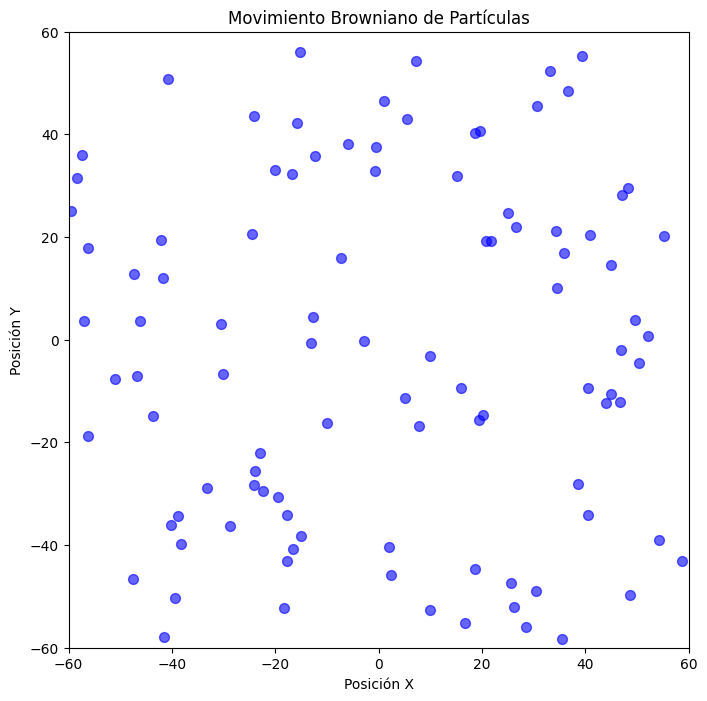

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parámetros de la simulación
num_particulas = 100  # Número de partículas
num_pasos = 200  # Número de pasos de tiempo
dt = 0.1  # Tamaño del paso de tiempo
diffusion_coefficient = 10  # Coeficiente de difusión

# Inicialización de posiciones iniciales aleatorias
posiciones = np.random.uniform(low=-50, high=50, size=(num_particulas, 2))

# Crear figura y ejes para la animación
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(-60, 60)
ax.set_ylim(-60, 60)
ax.set_xlabel('Posición X')
ax.set_ylabel('Posición Y')
ax.set_title('Movimiento Browniano de Partículas')

# Inicialización del gráfico (puntos vacíos) para la animación
puntos = ax.scatter(posiciones[:, 0], posiciones[:, 1], s=50, c='blue', alpha=0.6)

# Función de animación para actualizar las posiciones en cada paso de tiempo
def animate(i):
    global posiciones
    
    # Generar el ruido (movimiento aleatorio) con distribución normal
    ruido = np.sqrt(2 * diffusion_coefficient * dt) * np.random.randn(num_particulas, 2)
    
    # Actualizar las posiciones
    posiciones += ruido
    
    # Aplicar condiciones de contorno periódicas
    posiciones = np.mod(posiciones + 60, 120) - 60
    
    # Actualizar los datos de los puntos en el gráfico de animación
    puntos.set_offsets(posiciones)
    
    return puntos,

# Crear la animación
ani = FuncAnimation(fig, animate, frames=num_pasos, blit=True, interval=50)

# Mostrar la animación en formato HTML (en Jupyter Notebook o compatible)
HTML(ani.to_jshtml())